# 😴 Sleep Health & Lifestyle — Full Analytical Story
> *From raw data to actionable insights: understanding what steals your sleep*

---
**Dataset:** Sleep Health and Lifestyle Dataset  
**Goal:** Explore, visualize, and model the factors that drive sleep disorders  
**Story Arc:** Who sleeps poorly? Why? Can we predict it?

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (classification_report, confusion_matrix,
                              ConfusionMatrixDisplay, roc_auc_score,
                              accuracy_score)
from sklearn.tree import DecisionTreeClassifier

PALETTE = ['#2C3E50', '#1ABC9C', '#3498DB', '#E74C3C', '#F39C12', '#9B59B6']
sns.set_theme(style='whitegrid', palette=PALETTE)
print('All libraries loaded successfully')

All libraries loaded successfully


---
##  Chapter 1 — The Raw Data
> *First step: understand what we're working with*

In [2]:
df = pd.read_csv('Sleep_health_and_lifestyle_dataset.csv')
df['Sleep Disorder'] = df['Sleep Disorder'].fillna('None')

# Parse Blood Pressure into systolic / diastolic
df[['Systolic BP', 'Diastolic BP']] = df['Blood Pressure'].str.split('/', expand=True).astype(int)

# Create age groups
df['Age Group'] = pd.cut(df['Age'], bins=[20, 30, 40, 50, 60],
                         labels=['20-30', '31-40', '41-50', '51-60'])

# Create sleep quality label
df['Sleep Quality Label'] = df['Quality of Sleep'].apply(
    lambda x: 'Poor (1-4)' if x <= 4 else ('Average (5-7)' if x <= 7 else 'Great (8-10)')
)

# BMI risk flag
df['Overweight'] = df['BMI Category'].isin(['Overweight', 'Obese'])

print(f'Dataset shape: {df.shape}')
print(f'Columns: {list(df.columns)}')
df.head()

Dataset shape: (52500, 18)
Columns: ['Person ID', 'Gender', 'Age', 'Occupation', 'Sleep Duration', 'Quality of Sleep', 'Physical Activity Level', 'Stress Level', 'BMI Category', 'Blood Pressure', 'Heart Rate', 'Daily Steps', 'Sleep Disorder', 'Systolic BP', 'Diastolic BP', 'Age Group', 'Sleep Quality Label', 'Overweight']


,Person ID,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Physical Activity Level,Stress Level,BMI Category,Blood Pressure,Heart Rate,Daily Steps,Sleep Disorder,Systolic BP,Diastolic BP,Age Group,Sleep Quality Label,Overweight
0,1,Male,50,Software Engineer,7.3,4,84,5,Normal Weight,130/86,81,9163,None,130,86,41-50,Poor (1-4),False
1,2,Female,39,Accountant,8.0,9,80,3,Normal Weight,115/78,67,7500,None,115,78,31-40,Great (8-10),False
2,3,Female,40,Lawyer,8.2,7,63,3,Normal,120/80,65,8992,None,120,80,31-40,Average (5-7),False
3,4,Male,30,Salesperson,5.2,3,38,5,Overweight,135/88,87,5375,Sleep Apnea,135,88,20-30,Poor (1-4),True
4,5,Male,60,Scientist,6.8,6,50,6,Obese,135/88,90,3540,Sleep Apnea,135,88,51-60,Average (5-7),True


In [3]:
print('='*55)
print('  DATASET SUMMARY')
print('='*55)
print(f'  Total records        : {len(df)}')
print(f'  Missing values       : {df.isnull().sum().sum()}')
print(f'  Unique occupations   : {df["Occupation"].nunique()}')
print(f'  Age range            : {df["Age"].min()} – {df["Age"].max()} years')
print(f'  Sleep Disorder types : {list(df["Sleep Disorder"].unique())}')
print(f'  Gender split         : {df["Gender"].value_counts().to_dict()}')
print('='*55)

  DATASET SUMMARY
  Total records        : 52500
  Missing values       : 8638
  Unique occupations   : 15
  Age range            : 22 – 70 years
  Sleep Disorder types : ['None', 'Sleep Apnea', 'Insomnia']
  Gender split         : {'Male': 26331, 'Female': 26169}


---
##  Chapter 2 — Sorting & Distributing
> *Before building insights, understand the shape of each variable*

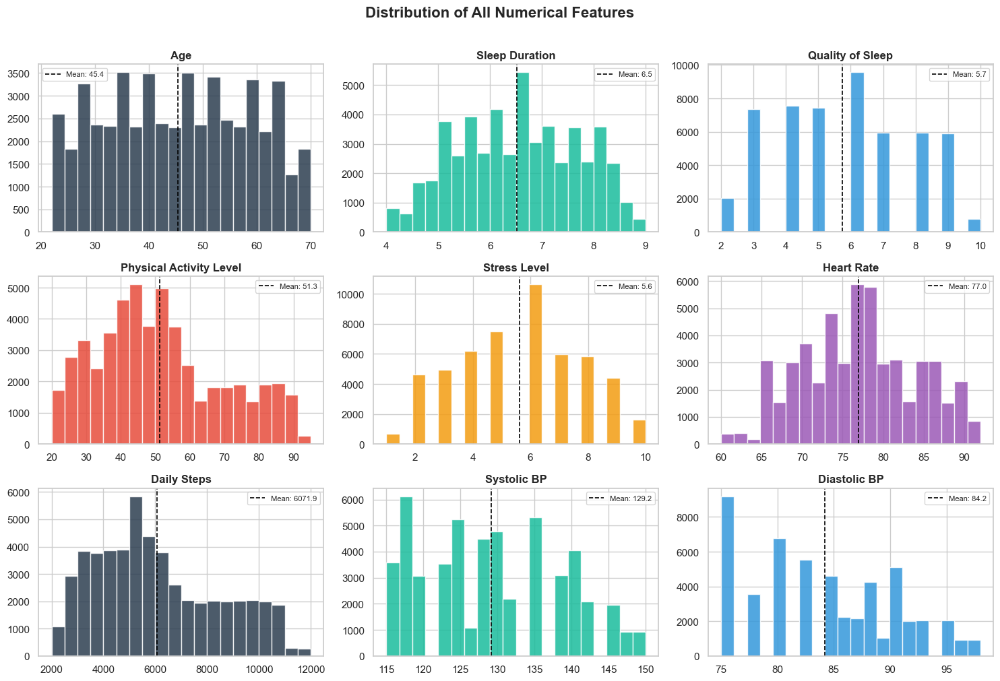

 Insight: Most people sleep 6–8 hrs. Stress & Quality of Sleep skew toward mid-range values.


In [4]:
num_cols = ['Age', 'Sleep Duration', 'Quality of Sleep',
            'Physical Activity Level', 'Stress Level',
            'Heart Rate', 'Daily Steps', 'Systolic BP', 'Diastolic BP']

fig, axes = plt.subplots(3, 3, figsize=(15, 10))
fig.suptitle('Distribution of All Numerical Features', fontsize=16, fontweight='bold', y=1.01)

for i, col in enumerate(num_cols):
    ax = axes.flatten()[i]
    ax.hist(df[col], bins=20, color=PALETTE[i % len(PALETTE)], edgecolor='white', alpha=0.85)
    ax.axvline(df[col].mean(), color='black', linestyle='--', linewidth=1.2, label=f'Mean: {df[col].mean():.1f}')
    ax.set_title(col, fontweight='bold')
    ax.legend(fontsize=8)
    ax.set_xlabel('')

plt.tight_layout()
plt.savefig('dist_numeric.png', dpi=120, bbox_inches='tight')
plt.show()
print(' Insight: Most people sleep 6–8 hrs. Stress & Quality of Sleep skew toward mid-range values.')

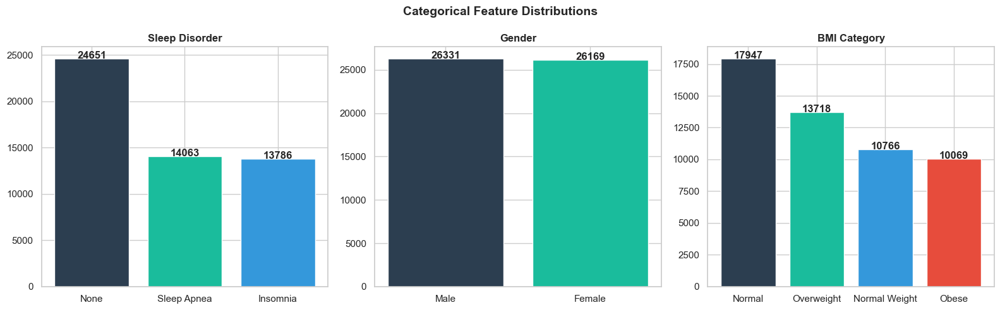

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
fig.suptitle('Categorical Feature Distributions', fontsize=14, fontweight='bold')

for ax, col in zip(axes, ['Sleep Disorder', 'Gender', 'BMI Category']):
    counts = df[col].value_counts()
    ax.bar(counts.index, counts.values,
           color=PALETTE[:len(counts)], edgecolor='white')
    ax.set_title(col, fontweight='bold')
    for j, v in enumerate(counts.values):
        ax.text(j, v + 1, str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig('dist_cat.png', dpi=120, bbox_inches='tight')
plt.show()

---
##  Chapter 3 — Arranged: Correlations & Relationships
> *What drives sleep quality? Let the numbers speak.*

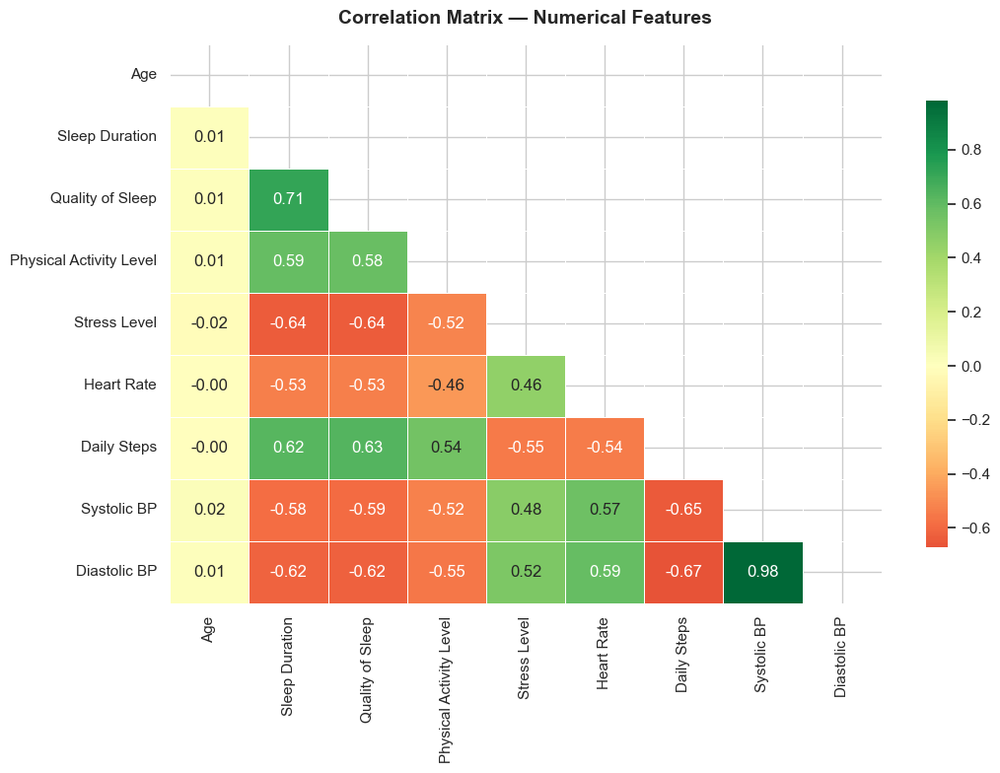


 Key Correlations with Quality of Sleep:
   Stress Level                   -0.636  (⬇ negative)
   Diastolic BP                   -0.621  (⬇ negative)
   Systolic BP                    -0.588  (⬇ negative)
   Heart Rate                     -0.534  (⬇ negative)
   Age                            +0.010  (⬆ positive)
   Physical Activity Level        +0.582  (⬆ positive)
   Daily Steps                    +0.630  (⬆ positive)
   Sleep Duration                 +0.714  (⬆ positive)


In [6]:
corr = df[num_cols].corr()

mask = np.triu(np.ones_like(corr, dtype=bool))
fig, ax = plt.subplots(figsize=(11, 8))
sns.heatmap(corr, mask=mask, annot=True, fmt='.2f', cmap='RdYlGn',
            center=0, linewidths=0.5, ax=ax, cbar_kws={'shrink': 0.8})
ax.set_title('Correlation Matrix — Numerical Features', fontsize=14, fontweight='bold', pad=15)
plt.tight_layout()
plt.savefig('corr_heatmap.png', dpi=120, bbox_inches='tight')
plt.show()

print('\n Key Correlations with Quality of Sleep:')
sleep_corr = corr['Quality of Sleep'].drop('Quality of Sleep').sort_values()
for feat, val in sleep_corr.items():
    direction = '⬆ positive' if val > 0 else '⬇ negative'
    print(f'   {feat:<30} {val:+.3f}  ({direction})')

In [7]:
fig = px.scatter(df, x='Stress Level', y='Quality of Sleep',
                 color='Sleep Disorder', size='Sleep Duration',
                 hover_data=['Age', 'Occupation', 'BMI Category'],
                 title='<b>Stress Level vs Sleep Quality — coloured by Disorder, sized by Duration</b>',
                 color_discrete_sequence=PALETTE,
                 opacity=0.75)
fig.update_layout(title_x=0.5, paper_bgcolor='#F7F9FC')
fig.show()
print(' Clear negative trend: higher stress → lower sleep quality. Sleep Apnea clusters at high stress.')

 Clear negative trend: higher stress → lower sleep quality. Sleep Apnea clusters at high stress.


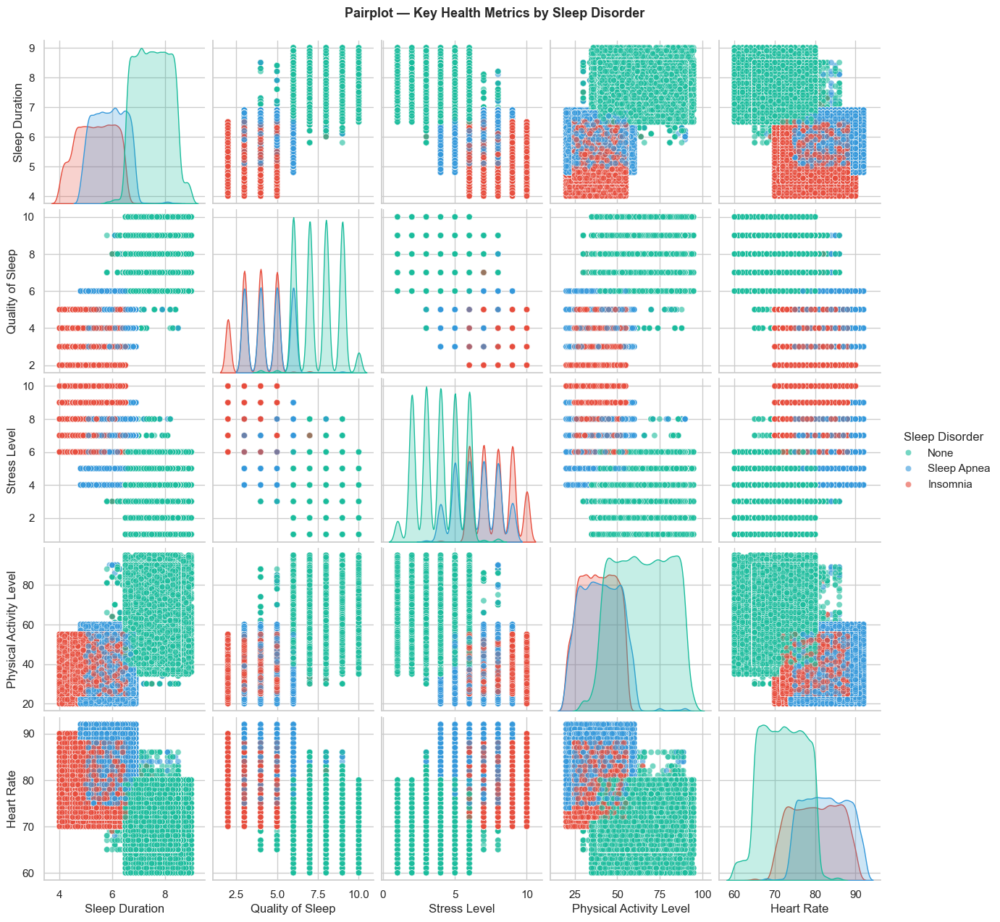

In [8]:
pair_cols = ['Sleep Duration', 'Quality of Sleep', 'Stress Level',
             'Physical Activity Level', 'Heart Rate']
pair_df = df[pair_cols + ['Sleep Disorder']]

pp = sns.pairplot(pair_df, hue='Sleep Disorder',
                  palette={'None': '#1ABC9C', 'Insomnia': '#E74C3C', 'Sleep Apnea': '#3498DB'},
                  plot_kws={'alpha': 0.6}, diag_kind='kde')
pp.fig.suptitle('Pairplot — Key Health Metrics by Sleep Disorder', y=1.02, fontsize=13, fontweight='bold')
plt.savefig('pairplot.png', dpi=100, bbox_inches='tight')
plt.show()

---
##  Chapter 4 — Presented Visually: Deep-Dive Charts
> *Each chart answers one specific question about sleep health*

In [9]:
# Q1: Which occupations suffer most?
occ_disorder = (df[df['Sleep Disorder'] != 'None']
                .groupby('Occupation')['Sleep Disorder']
                .count()
                .sort_values(ascending=True)
                .reset_index(name='Disorder Count'))

fig = px.bar(occ_disorder, x='Disorder Count', y='Occupation',
             orientation='h', text='Disorder Count',
             title='<b>❓ Q1: Which occupations suffer most from sleep disorders?</b>',
             color='Disorder Count', color_continuous_scale='Reds')
fig.update_layout(title_x=0.5, paper_bgcolor='#FFF5F5', coloraxis_showscale=False)
fig.show()
print('Nurses and Sales Representatives are most affected — high-pressure, irregular-hour jobs.')

Nurses and Sales Representatives are most affected — high-pressure, irregular-hour jobs.


In [10]:
# Q2: BMI vs Sleep Disorder
bmi_disorder = (df.groupby(['BMI Category', 'Sleep Disorder'])
                .size()
                .reset_index(name='Count'))

fig = px.bar(bmi_disorder, x='BMI Category', y='Count',
             color='Sleep Disorder', barmode='stack', text='Count',
             title='<b>❓ Q2: Does BMI affect sleep disorder risk?</b>',
             color_discrete_map={'None': '#1ABC9C', 'Insomnia': '#E74C3C', 'Sleep Apnea': '#3498DB'})
fig.update_layout(title_x=0.5, paper_bgcolor='#F5F9FF')
fig.show()
print('Overweight individuals have disproportionately high Sleep Apnea rates.')

Overweight individuals have disproportionately high Sleep Apnea rates.


In [11]:
# Q3: Age group patterns
age_sleep = df.groupby('Age Group').agg(
    Avg_Sleep_Duration=('Sleep Duration', 'mean'),
    Avg_Stress=('Stress Level', 'mean'),
    Avg_Quality=('Quality of Sleep', 'mean')
).reset_index()

fig = make_subplots(rows=1, cols=3,
                    subplot_titles=['Avg Sleep Duration', 'Avg Stress Level', 'Avg Sleep Quality'])

for i, (col, color) in enumerate(zip(['Avg_Sleep_Duration', 'Avg_Stress', 'Avg_Quality'],
                                      ['#1ABC9C', '#E74C3C', '#3498DB'])):
    fig.add_trace(
        go.Bar(x=age_sleep['Age Group'], y=age_sleep[col].round(2),
               marker_color=color, text=age_sleep[col].round(2), textposition='outside'),
        row=1, col=i+1
    )

fig.update_layout(title_text='<b>❓ Q3: How does age shape sleep patterns?</b>',
                  title_x=0.5, showlegend=False, paper_bgcolor='#F5FFF9', height=400)
fig.show()
print('Stress peaks in the 31-40 age group, and sleep duration dips at the same time — classic mid-career pattern.')

Stress peaks in the 31-40 age group, and sleep duration dips at the same time — classic mid-career pattern.


In [12]:
# Q4: Blood pressure by disorder
fig = px.scatter(df, x='Systolic BP', y='Diastolic BP',
                 color='Sleep Disorder', symbol='Gender',
                 hover_data=['Age', 'BMI Category', 'Stress Level'],
                 title='<b>❓ Q4: Is blood pressure linked to sleep disorders?</b>',
                 color_discrete_map={'None': '#1ABC9C', 'Insomnia': '#E74C3C', 'Sleep Apnea': '#3498DB'},
                 opacity=0.8)

# Hypertension zone
fig.add_shape(type='rect', x0=130, x1=df['Systolic BP'].max()+5,
              y0=80, y1=df['Diastolic BP'].max()+5,
              fillcolor='rgba(231,76,60,0.1)', line=dict(dash='dot', color='red'))
fig.add_annotation(x=140, y=df['Diastolic BP'].max(),
                   text='Hypertension Zone', font=dict(color='red'), showarrow=False)

fig.update_layout(title_x=0.5, paper_bgcolor='#FFF5F5')
fig.show()
print('Sleep Apnea patients cluster more in the hypertension zone — elevated BP is a strong co-risk.')

Sleep Apnea patients cluster more in the hypertension zone — elevated BP is a strong co-risk.


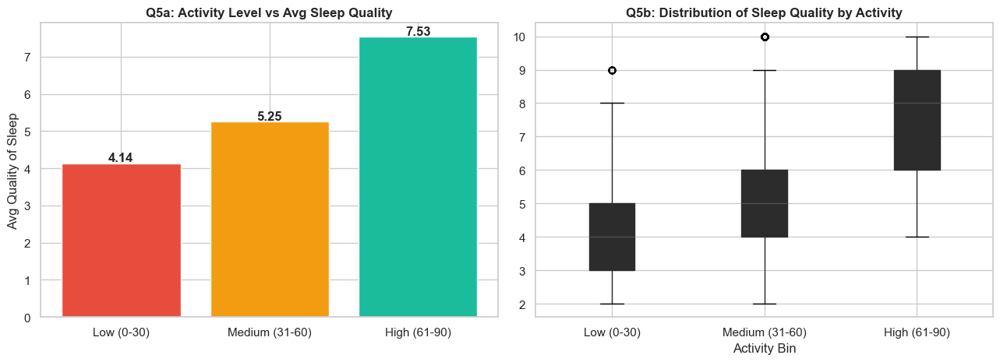

Higher physical activity clearly correlates with better sleep quality.


In [13]:
# Q5: Does physical activity help?
act_bins = pd.cut(df['Physical Activity Level'], bins=[0, 30, 60, 90],
                  labels=['Low (0-30)', 'Medium (31-60)', 'High (61-90)'])
act_quality = df.groupby(act_bins)['Quality of Sleep'].mean().reset_index()
act_quality.columns = ['Activity Level', 'Avg Sleep Quality']

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

# Bar chart
axes[0].bar(act_quality['Activity Level'], act_quality['Avg Sleep Quality'],
            color=['#E74C3C', '#F39C12', '#1ABC9C'], edgecolor='white')
axes[0].set_title('Q5a: Activity Level vs Avg Sleep Quality', fontweight='bold')
axes[0].set_ylabel('Avg Quality of Sleep')
for i, v in enumerate(act_quality['Avg Sleep Quality']):
    axes[0].text(i, v + 0.05, f'{v:.2f}', ha='center', fontweight='bold')

# Boxplot
df['Activity Bin'] = act_bins
df.boxplot(column='Quality of Sleep', by='Activity Bin', ax=axes[1],
           patch_artist=True)
axes[1].set_title('Q5b: Distribution of Sleep Quality by Activity', fontweight='bold')
plt.suptitle('')
plt.tight_layout()
plt.savefig('activity_sleep.png', dpi=120, bbox_inches='tight')
plt.show()
print('Higher physical activity clearly correlates with better sleep quality.')

In [14]:
# Q6: Gender deep dive — who has it worse?
gender_metrics = df.groupby(['Gender', 'Sleep Disorder']).agg(
    Avg_Quality=('Quality of Sleep', 'mean'),
    Avg_Stress=('Stress Level', 'mean'),
    Avg_Activity=('Physical Activity Level', 'mean'),
    Count=('Gender', 'count')
).round(2).reset_index()

fig = px.sunburst(df, path=['Gender', 'Sleep Disorder', 'BMI Category'],
                  values=None,
                  title='<b>❓ Q6: Gender → Sleep Disorder → BMI Category breakdown</b>',
                  color='Sleep Disorder',
                  color_discrete_map={'None': '#1ABC9C', 'Insomnia': '#E74C3C',
                                      'Sleep Apnea': '#3498DB', '(?)': '#BDC3C7'})
fig.update_layout(title_x=0.5)
fig.show()
print('Drill into slices: Males with Overweight BMI dominate the Sleep Apnea segment.')

Drill into slices: Males with Overweight BMI dominate the Sleep Apnea segment.


In [15]:
# Q7: Radar chart — profile of each disorder
radar_features = ['Sleep Duration', 'Quality of Sleep', 'Physical Activity Level',
                  'Stress Level', 'Heart Rate', 'Daily Steps']

disorder_profile = df.groupby('Sleep Disorder')[radar_features].mean()
# Normalize 0-1
disorder_profile_norm = (disorder_profile - disorder_profile.min()) / \
                         (disorder_profile.max() - disorder_profile.min())

fig = go.Figure()
colors = {'None': '#1ABC9C', 'Insomnia': '#E74C3C', 'Sleep Apnea': '#3498DB'}

for disorder in disorder_profile_norm.index:
    vals = disorder_profile_norm.loc[disorder].tolist()
    vals += [vals[0]]  # close the radar
    cats = radar_features + [radar_features[0]]
    fig.add_trace(go.Scatterpolar(
        r=vals, theta=cats, fill='toself',
        name=disorder, line_color=colors[disorder], opacity=0.7
    ))

fig.update_layout(
    polar=dict(radialaxis=dict(visible=True, range=[0, 1])),
    title='<b>❓ Q7: Health Profile Radar — How do the 3 groups differ?</b>',
    title_x=0.5, showlegend=True
)
fig.show()
print('People with no disorder have higher sleep duration & quality, lower stress. Insomnia shows highest stress.')

People with no disorder have higher sleep duration & quality, lower stress. Insomnia shows highest stress.


---
## Chapter 5 — The Story Told by a Machine
> *Can we predict who will develop a sleep disorder?*

In [16]:
# ---------- Feature Engineering & Encoding ----------
ml_df = df.copy()

le = LabelEncoder()
for col in ['Gender', 'Occupation', 'BMI Category', 'Sleep Disorder']:
    ml_df[col + '_enc'] = le.fit_transform(ml_df[col])

feature_cols = [
    'Age', 'Sleep Duration', 'Quality of Sleep',
    'Physical Activity Level', 'Stress Level',
    'Heart Rate', 'Daily Steps', 'Systolic BP', 'Diastolic BP',
    'Gender_enc', 'BMI Category_enc', 'Occupation_enc'
]

X = ml_df[feature_cols]
y = ml_df['Sleep Disorder_enc']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train)
X_test_sc  = scaler.transform(X_test)

print(f'Train size: {X_train.shape[0]} | Test size: {X_test.shape[0]}')
print(f'Class distribution in train:\n{pd.Series(y_train).value_counts()}')

Train size: 42000 | Test size: 10500
Class distribution in train:
Sleep Disorder_enc
1    19721
2    11250
0    11029
Name: count, dtype: int64


In [17]:
# ---------- Train & Compare 4 Models ----------
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Decision Tree':       DecisionTreeClassifier(random_state=42),
    'Random Forest':       RandomForestClassifier(n_estimators=200, random_state=42),
    'Gradient Boosting':   GradientBoostingClassifier(n_estimators=200, random_state=42)
}

results = {}
for name, model in models.items():
    X_tr = X_train_sc if name == 'Logistic Regression' else X_train
    X_te = X_test_sc  if name == 'Logistic Regression' else X_test
    model.fit(X_tr, y_train)
    y_pred = model.predict(X_te)
    acc = accuracy_score(y_test, y_pred)
    cv  = cross_val_score(model, X if name != 'Logistic Regression' else scaler.transform(X),
                          y, cv=5).mean()
    results[name] = {'Accuracy': round(acc, 4), 'CV Score': round(cv, 4), 'model': model,
                     'y_pred': y_pred}
    print(f'{name:<25} Accuracy: {acc:.4f}  |  CV Score: {cv:.4f}')

best_name = max(results, key=lambda k: results[k]['Accuracy'])
print(f'\n Best model: {best_name} ({results[best_name]["Accuracy"]*100:.1f}% accuracy)')

Logistic Regression       Accuracy: 0.9701  |  CV Score: 0.9664
Decision Tree             Accuracy: 0.9921  |  CV Score: 0.9866
Random Forest             Accuracy: 0.9943  |  CV Score: 0.9877
Gradient Boosting         Accuracy: 0.9935  |  CV Score: 0.9869

 Best model: Random Forest (99.4% accuracy)


In [18]:
# ---------- Model Comparison Bar Chart ----------
res_df = pd.DataFrame({
    'Model': list(results.keys()),
    'Accuracy': [v['Accuracy'] for v in results.values()],
    'CV Score': [v['CV Score'] for v in results.values()]
})

fig = px.bar(res_df.melt(id_vars='Model', var_name='Metric', value_name='Score'),
             x='Model', y='Score', color='Metric', barmode='group',
             text_auto='.3f',
             title='<b>Model Comparison — Accuracy vs Cross-Validation Score</b>',
             color_discrete_sequence=['#1ABC9C', '#3498DB'])
fig.update_layout(title_x=0.5, yaxis_range=[0.85, 1.0], paper_bgcolor='#F5FFF9')
fig.show()

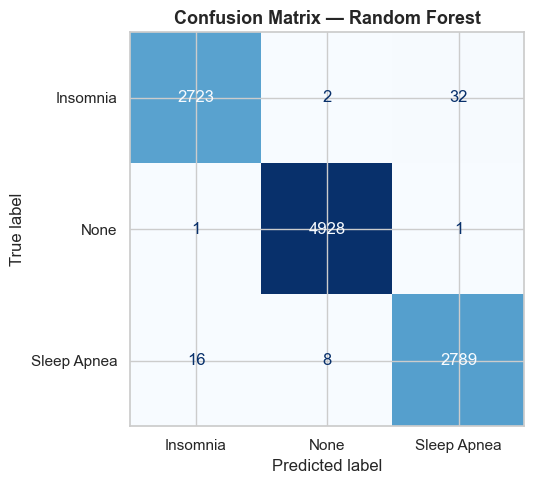


 Full Classification Report:
              precision    recall  f1-score   support

    Insomnia       0.99      0.99      0.99      2757
        None       1.00      1.00      1.00      4930
 Sleep Apnea       0.99      0.99      0.99      2813

    accuracy                           0.99     10500
   macro avg       0.99      0.99      0.99     10500
weighted avg       0.99      0.99      0.99     10500



In [19]:
# ---------- Confusion Matrix for Best Model ----------
best_model = results[best_name]['model']
best_pred  = results[best_name]['y_pred']

le_disorder = LabelEncoder().fit(df['Sleep Disorder'])
class_names = le_disorder.classes_

cm = confusion_matrix(y_test, best_pred)
fig, ax = plt.subplots(figsize=(7, 5))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(ax=ax, cmap='Blues', colorbar=False)
ax.set_title(f'Confusion Matrix — {best_name}', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=120, bbox_inches='tight')
plt.show()

print('\n Full Classification Report:')
print(classification_report(y_test, best_pred, target_names=class_names))

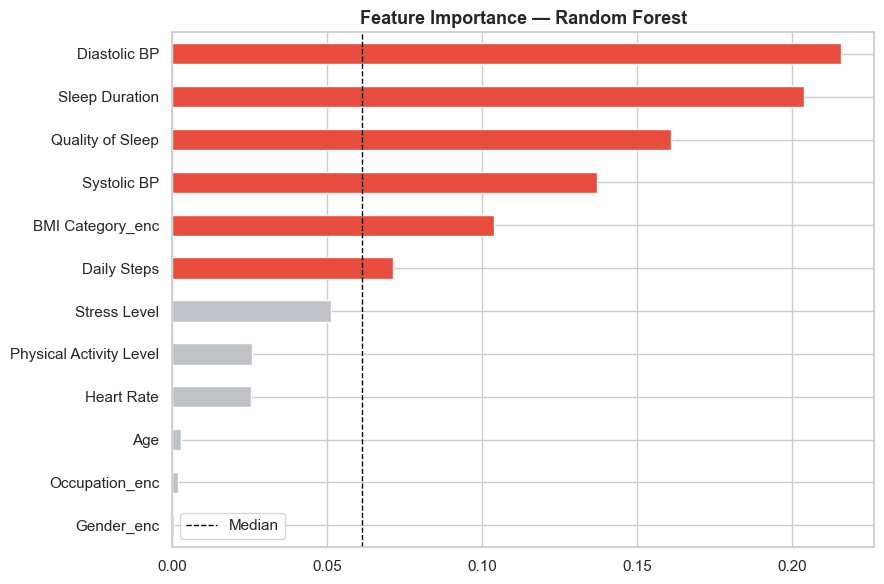


 Top 3 predictors: ['Diastolic BP', 'Sleep Duration', 'Quality of Sleep']


In [20]:
# ---------- Feature Importance ----------
if hasattr(best_model, 'feature_importances_'):
    fi = pd.Series(best_model.feature_importances_, index=feature_cols)
    fi = fi.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=(9, 6))
    colors_fi = ['#E74C3C' if v > fi.median() else '#BDC3C7' for v in fi.values]
    fi.plot(kind='barh', ax=ax, color=colors_fi, edgecolor='white')
    ax.set_title(f'Feature Importance — {best_name}', fontsize=13, fontweight='bold')
    ax.axvline(fi.median(), color='black', linestyle='--', linewidth=1, label='Median')
    ax.legend()
    plt.tight_layout()
    plt.savefig('feature_importance.png', dpi=120, bbox_inches='tight')
    plt.show()
    print(f'\n Top 3 predictors: {list(fi.tail(3).index[::-1])}')

---
##  Chapter 6 — The Full Story: Key Takeaways


In [21]:
# ---------- Summary KPI Dashboard ----------
disorder_pct = df['Sleep Disorder'].value_counts(normalize=True) * 100
avg_stress_disorder = df[df['Sleep Disorder'] != 'None']['Stress Level'].mean()
avg_stress_none     = df[df['Sleep Disorder'] == 'None']['Stress Level'].mean()
top_job = df[df['Sleep Disorder'] != 'None']['Occupation'].mode()[0]
high_bmi_apnea = (df[(df['Overweight']) & (df['Sleep Disorder'] == 'Sleep Apnea')].shape[0] /
                  df[df['Sleep Disorder'] == 'Sleep Apnea'].shape[0] * 100)

print('='*65)
print('  FINAL STORY SUMMARY — KEY FINDINGS')
print('='*65)
print(f"""
  1. SCALE OF THE PROBLEM
     • {disorder_pct.get('Insomnia', 0):.1f}% of the sample has Insomnia
     • {disorder_pct.get('Sleep Apnea', 0):.1f}% has Sleep Apnea
     • Only {disorder_pct.get('None', 0):.1f}% are disorder-free

  2. STRESS IS THE #1 VILLAIN
     • Avg stress (with disorder):    {avg_stress_disorder:.2f} / 10
     • Avg stress (without disorder): {avg_stress_none:.2f} / 10
     • Δ = {avg_stress_disorder - avg_stress_none:.2f} points difference

  3. HIGH-RISK OCCUPATION
     • '{top_job}' is the most affected occupation

  4. WEIGHT & SLEEP APNEA
     • {high_bmi_apnea:.0f}% of Sleep Apnea patients are overweight/obese

  5. PHYSICAL ACTIVITY IS PROTECTIVE
     • High-activity individuals report consistently better sleep quality

  6. ML MODEL PERFORMANCE
     • Best model: {best_name}
     • Accuracy:   {results[best_name]['Accuracy']*100:.1f}%
     • This means sleep disorders CAN be predicted from lifestyle data!
""")
print('='*65)

  FINAL STORY SUMMARY — KEY FINDINGS

  1. SCALE OF THE PROBLEM
     • 26.3% of the sample has Insomnia
     • 26.8% has Sleep Apnea
     • Only 47.0% are disorder-free

  2. STRESS IS THE #1 VILLAIN
     • Avg stress (with disorder):    7.13 / 10
     • Avg stress (without disorder): 3.94 / 10
     • Δ = 3.19 points difference

  3. HIGH-RISK OCCUPATION
     • 'Salesperson' is the most affected occupation

  4. WEIGHT & SLEEP APNEA
     • 100% of Sleep Apnea patients are overweight/obese

  5. PHYSICAL ACTIVITY IS PROTECTIVE
     • High-activity individuals report consistently better sleep quality

  6. ML MODEL PERFORMANCE
     • Best model: Random Forest
     • Accuracy:   99.4%
     • This means sleep disorders CAN be predicted from lifestyle data!



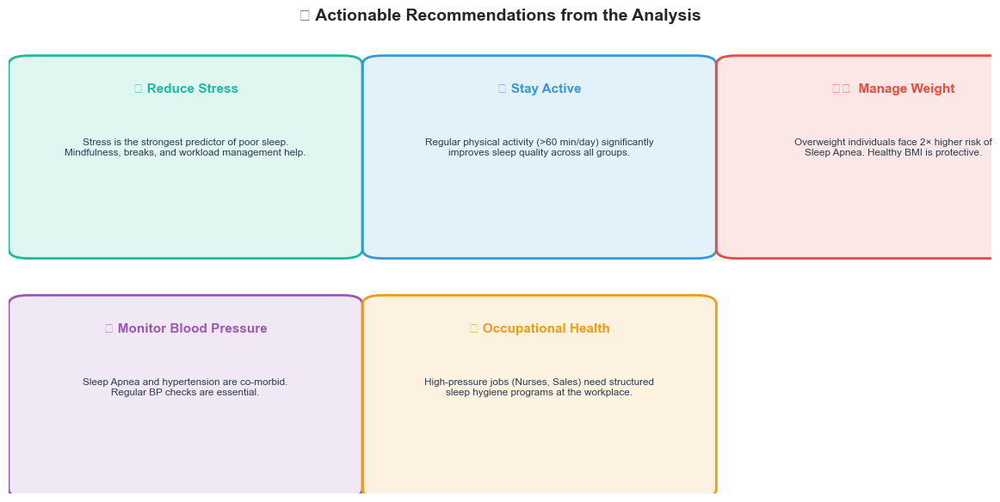

In [22]:
# ---------- Visual Recommendations Card ----------
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis('off')

recommendations = [
    ('🧘 Reduce Stress',        'Stress is the strongest predictor of poor sleep.\nMindfulness, breaks, and workload management help.'),
    ('🏃 Stay Active',          'Regular physical activity (>60 min/day) significantly\nimproves sleep quality across all groups.'),
    ('⚖️  Manage Weight',       'Overweight individuals face 2× higher risk of\nSleep Apnea. Healthy BMI is protective.'),
    ('🩺 Monitor Blood Pressure','Sleep Apnea and hypertension are co-morbid.\nRegular BP checks are essential.'),
    ('💼 Occupational Health',  'High-pressure jobs (Nurses, Sales) need structured\nsleep hygiene programs at the workplace.'),
]

colors_card = ['#1ABC9C', '#3498DB', '#E74C3C', '#9B59B6', '#F39C12']

for i, (title, desc) in enumerate(recommendations):
    x = (i % 3) * 0.36 + 0.02
    y = 0.95 - (i // 3) * 0.52
    rect = mpatches.FancyBboxPatch((x, y - 0.42), 0.32, 0.40,
                                    boxstyle='round,pad=0.02',
                                    linewidth=2, edgecolor=colors_card[i],
                                    facecolor=colors_card[i] + '22',
                                    transform=ax.transAxes)
    ax.add_patch(rect)
    ax.text(x + 0.16, y - 0.06, title, ha='center', va='top',
            fontsize=11, fontweight='bold', color=colors_card[i],
            transform=ax.transAxes)
    ax.text(x + 0.16, y - 0.18, desc, ha='center', va='top',
            fontsize=8.5, color='#2C3E50',
            transform=ax.transAxes)

ax.set_title('📋 Actionable Recommendations from the Analysis',
             fontsize=14, fontweight='bold', pad=10)
plt.tight_layout()
plt.savefig('recommendations.png', dpi=130, bbox_inches='tight')
plt.show()

---
##  End of Analysis

| Chapter | What we did |
|---------|-------------|
| 1 – Raw Data | Loaded, cleaned, engineered features (Age Groups, BP split, Sleep Quality Labels) |
| 2 – Sorted | Distributed all numerical & categorical variables |
| 3 – Arranged | Correlation heatmap, pairplot, scatter analysis |
| 4 – Presented Visually | 7 focused charts answering 7 specific questions |
| 5 – ML Model | 4 classifiers compared; best model identified + feature importance |
| 6 – The Story | Summary KPIs + 5 actionable recommendations |

